In [16]:
import pandas as pd
import numpy as np

%matplotlib inline

from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.pipeline import FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

from lime.lime_tabular import LimeTabularExplainer

pd.set_option('display.max_columns', None)

In [2]:
# Class to help select categorical vs. continuous data as part of the pipeline (see below)
class DataSelector(BaseEstimator, TransformerMixin):
    '''Select columns of numpy arrays based on attribute_indices.'''

    def __init__(self, attribute_indices):
        self.attribute_indices = attribute_indices

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return np.array(X)[:,self.attribute_indices]

In [3]:
dir(DataSelector)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_get_param_names',
 'fit',
 'fit_transform',
 'get_params',
 'set_params',
 'transform']

In [4]:
dir(BaseEstimator)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_get_param_names',
 'get_params',
 'set_params']

In [5]:
dir(TransformerMixin)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'fit_transform']

In [29]:
# Load (preprocessed) data
# 
# The raw data was downloaded from https://data.stanford.edu/hcmst and preprocessed.
# We combined data sets collected across several years, we transformed select variables 
# (e.g., partner_education to be at the same level of granularity as education),
# and added variables like the absolute age difference, education difference, etc.
# Finally, we determined whether couples were still together (i.e., our labels).
#
# We provide the preprocessed data as a csv file in the same repo as this notebook.

df = pd.read_csv('couples.csv')

# Order features (numeric first, categorical second) since it's convenient later
feature_order = ['age',
                 'partner_age',
                 'age_diff_abs',
                 'children',
                 'visits_relatives',
                 'education',
                 'marital_status',
                 'partner_education',
                 'gender',
                 'house',
                 'income',
                 'msa',
                 'rent',
                 'political',
                 'religion',
                 'work',
                 'gender_older',
                 'education_difference',
                 'success']

data = df[feature_order]
data = data[data.house != 'boat, rv, van, etc.'] # only one data point with this value, discard



C:\Users\oldyu\AppData\Roaming\Python\Python36\site-packages\scipy\stats\stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dty

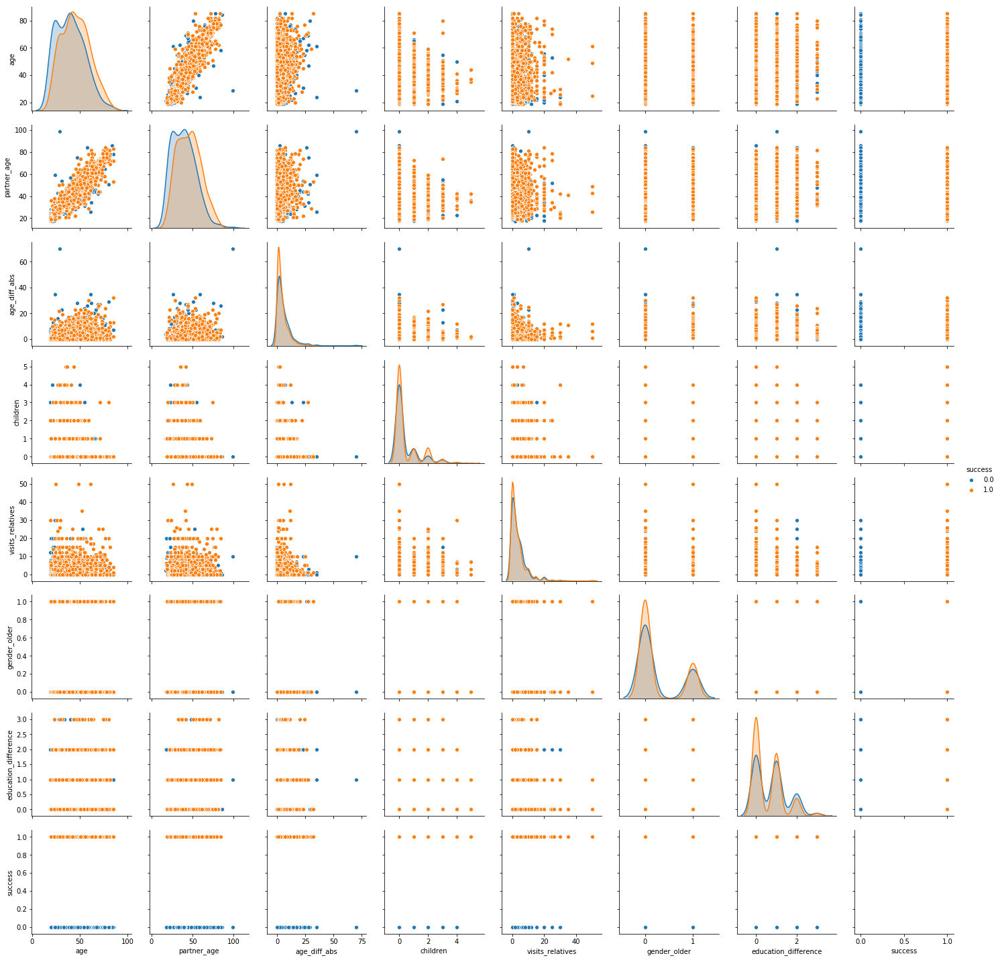

In [30]:
sns.pairplot(data, hue='success');

In [31]:
labels = data.pop('success')

In [32]:
# Take a peak at the data
data.head()

,age,partner_age,age_diff_abs,children,visits_relatives,education,marital_status,partner_education,gender,house,income,msa,rent,political,religion,work,gender_older,education_difference
0,52,48,4,0.0,0,bachelor's degree or higher,living with partner,some college,female,a building with 2 or more apartments,"$20,000 to $24,999",metro,rented for cash,democrat,catholic,working - as a paid employee,1,1
1,28,30,2,0.0,0,bachelor's degree or higher,living with partner,bachelor's degree or higher,female,a building with 2 or more apartments,"$40,000 to $49,999",metro,rented for cash,democrat,jewish,working - as a paid employee,0,0
2,31,40,9,0.0,1,some college,never married,high school,male,a building with 2 or more apartments,"$40,000 to $49,999",metro,owned or being bought by you or someone in you...,democrat,"other non-christian, please specify:",working - as a paid employee,1,1
3,53,55,2,0.0,1,bachelor's degree or higher,living with partner,bachelor's degree or higher,male,a one-family house detached from any other house,"$125,000 to $149,999",metro,owned or being bought by you or someone in you...,democrat,"protestant (e.g., methodist, lutheran, presbyt...",working - as a paid employee,1,0
4,58,51,7,0.0,0,bachelor's degree or higher,separated,bachelor's degree or higher,male,a building with 2 or more apartments,"$15,000 to $19,999",metro,rented for cash,democrat,"protestant (e.g., methodist, lutheran, presbyt...",working - as a paid employee,0,0


In [33]:
# Define categorical names and indices
categorical_features = list(data.columns[5:])
categorical_idx = list(range(5, len(data.columns)))
continuous_features = list(data.columns[0:5])
continuous_idx = list(range(0,5))

X = data.values

# Get feature names and their values for categorical data (needed for LIME)
categorical_names = {}
for idx, feature in zip(categorical_idx, categorical_features):
    le = LabelEncoder()
    X[:, idx] = le.fit_transform(X[:, idx])
    categorical_names[idx] = le.classes_

# To suppress a warning later (not strictly necessary)
X = X.astype(float)

# Train test split
train, test, labels_train, labels_test = train_test_split(
    X, labels, train_size=0.70, random_state=42
)

d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\sklearn\model_selection\_split.py:2069: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [34]:
# Preprocessing pipeline
#      
# LIME needs a function that takes raw inputs and returns a prediction (see below).     
# We use sklearn's pipeline to handle preprocessing, it simplifies the interaction with LIME (see below). 
# There are several ways to build this pipeline. For demo purposes, we here show the verbose option (and we
# avoid scaling one-hot encoded features).

continuous_pipeline = Pipeline([
    ('selector', DataSelector(continuous_idx)),
    ('scaler', StandardScaler()),
    ])

categorical_pipeline = Pipeline([
    ('selector', DataSelector(categorical_idx)),
    ('encoder', OneHotEncoder(sparse=False)),
    ])

preprocessing_pipeline = FeatureUnion(transformer_list=[
    ("continuous_pipeline", continuous_pipeline),
    ("categorical_pipeline", categorical_pipeline),
    ])

# There are less verbose alternatives, especially if we scale one-hot encoded features,
# an accepted practice in the machine learning community:
#
#     preprocessing_pipeline = Pipeline([
#        ('onehotencoder', OneHotEncoder(categorical_features=categorical_idx, sparse=False)),
#        ('scaler', StandardScaler())
#     ])
#
# Finally, instead of the low-level Pipeline constructor, we can use sklearn's makepipeline:
#
#     preprocessing_pipeline = make_pipeline(
#         OneHotEncoder(categorical_features=categorical_idx, sparse=False),
#         StandardScaler()
#     )

In [35]:
# Set up the model and GridSearch for random forest hyperparameter tuning
param_grid = [{'n_estimators': [16, 20, 24],
               'max_features': [4, 8, 12, 16],
               'min_samples_split': [8, 12, 16],
               'max_depth': [15, 20, 25]}]

rf = RandomForestClassifier(class_weight='balanced')
grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='neg_mean_squared_error')

# Extend the preprocessing pipeline to include random forest and grid search
pipeline = make_pipeline(preprocessing_pipeline, grid_search)

# Fit the model and tune the hyperparameters
pipeline.fit(train, labels_train)

d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\sklearn\preprocessing\_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


Pipeline(memory=None,
     steps=[('featureunion', FeatureUnion(n_jobs=None,
       transformer_list=[('continuous_pipeline', Pipeline(memory=None,
     steps=[('selector', DataSelector(attribute_indices=[0, 1, 2, 3, 4])), ('scaler', StandardScaler(copy=True, with_mean=True, with_std=True))])), ('categorical_pipeline', Pipeli..._jobs', refit=True, return_train_score='warn',
       scoring='neg_mean_squared_error', verbose=0))])

In [36]:
# Hyperparameters found by GridSearchCV
print(pipeline.named_steps['gridsearchcv'].best_params_)

{'max_depth': 15, 'max_features': 4, 'min_samples_split': 8, 'n_estimators': 20}


In [89]:
print("Accuracy = {:.2f}".format(pipeline.score(test, labels_test)))

Accuracy = -0.20


In [37]:
# Evalute random forest classifier on training data (it overfits, small sample size)
y_predict = pipeline.predict(train)
f1 = f1_score(labels_train, y_predict)
print('F1 on train:', f1)

# Evalute random forest classifier on test data
y_predict = pipeline.predict(test)
f1 = f1_score(labels_test, y_predict)
print('F1 on test:', f1)

F1 on train: 0.9515816655907037
F1 on test: 0.8668639053254438


In [38]:
# Get feature importances of random forest model ("global interpretability")
best_estimator = pipeline.named_steps['gridsearchcv'].best_estimator_

importances = best_estimator.feature_importances_
std = np.std([tree.feature_importances_ for tree in best_estimator.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
feature_names = data.columns
for f in range(data.shape[1]):
    print("%2d. feature %s (%f)" %
          (f + 1, feature_names[f], importances[indices[f]]))

Feature ranking:
 1. feature age (0.206116)
 2. feature partner_age (0.067304)
 3. feature age_diff_abs (0.056115)
 4. feature children (0.053921)
 5. feature visits_relatives (0.051586)
 6. feature education (0.051419)
 7. feature marital_status (0.034919)
 8. feature partner_education (0.023674)
 9. feature gender (0.017464)
10. feature house (0.017197)
11. feature income (0.015537)
12. feature msa (0.015021)
13. feature rent (0.014817)
14. feature political (0.014473)
15. feature religion (0.013937)
16. feature work (0.013266)
17. feature gender_older (0.013253)
18. feature education_difference (0.012397)


In [39]:
# Use LIME to explain individual predictions, initialize explainer object
explainer = LimeTabularExplainer(
    train,
    class_names=['BrokeUp', 'StayedTogether'],
    feature_names=list(data.columns),
    categorical_features=categorical_idx,
    categorical_names=categorical_names,
    discretize_continuous=True
)

In [157]:
i = 30
exp = explainer.explain_instance(test[example], pipeline.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

Couples probability of staying together: 0.7764914219283098


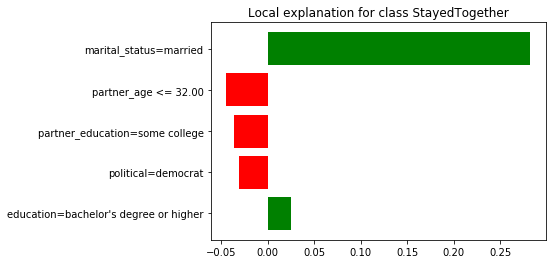

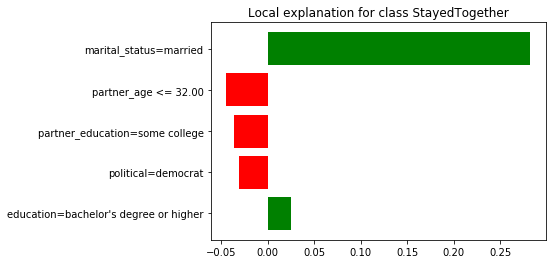

In [40]:
# Explain a prediction ("local interpretability"): 
# Now we see that the pipeline that takes raw data and returns the prediction 
# of the trained model now comes in conveniently.
example = 3
exp = explainer.explain_instance(test[example], pipeline.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

Couples probability of staying together: 0.6402052016293599


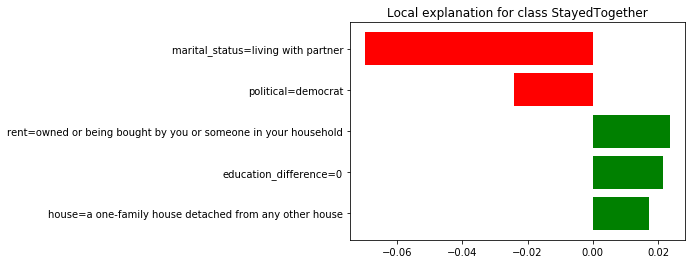

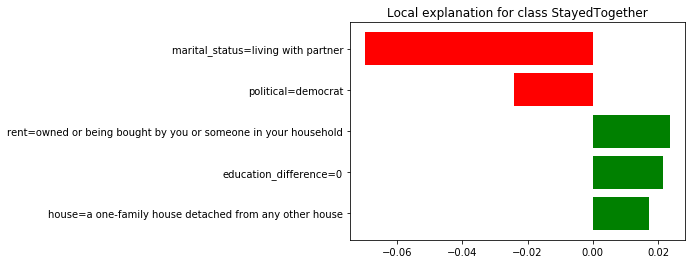

In [41]:
# Explain another prediction ("local interpretability"): 
example = 13
exp = explainer.explain_instance(test[example], pipeline.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [42]:
test[example]


array([46., 48.,  2.,  0.,  3.,  1.,  1.,  1.,  1.,  3., 11.,  0.,  1.,
        0.,  2.,  5.,  1.,  0.])

In [43]:
# and we see differences in explaining the model's predictions.

Couples probability of staying together: 0.7011877151280206


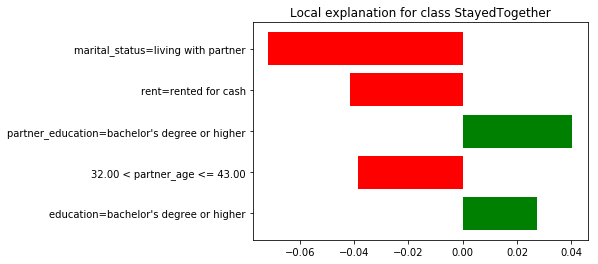

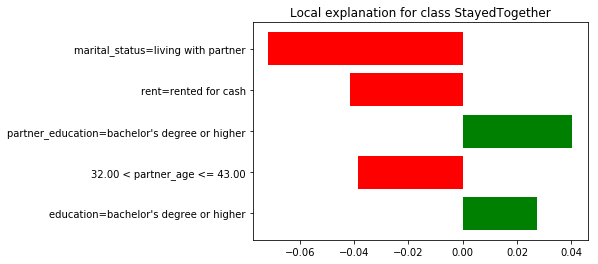

In [44]:
# Using LIME for for relationship management (not advised): Current chance of relationship success.
current = [34, 36, 2, 0, 1, 0, 1, 0, 0, 0, 18, 0, 2, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(current), pipeline.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [ ]:
exp = explainer.explain_instance(np.array(current), pipeline.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

In [163]:
exp = explainer.explain_instance(np.array(increase_income), pipeline.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

Couples probability of staying together: 0.686174625854141


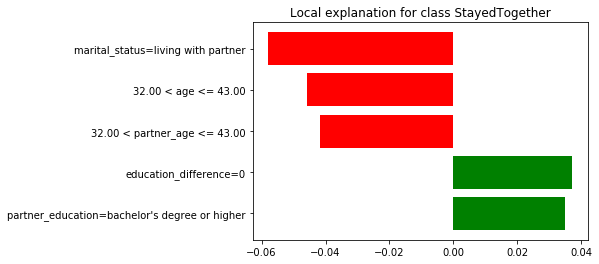

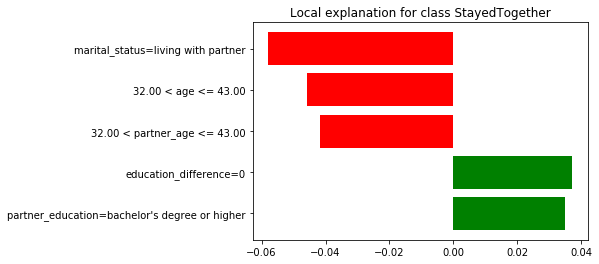

In [21]:
# Should I ask for a pay increase? It doesn't matter much.
increase_income = [34, 36, 2, 0, 1, 0, 1, 0, 0, 0, 6, 0, 2, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(increase_income), pipeline.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

Couples probability of staying together: 0.7519976446496457


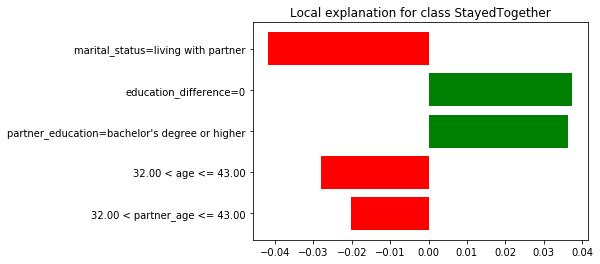

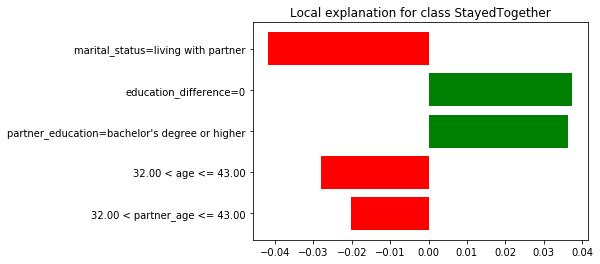

In [22]:
# Should I buy a house? Maybe?
buy_house = [34, 36, 2, 0, 1, 0, 1, 0, 0, 0, 6, 0, 1, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(buy_house), pipeline.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [159]:
exp = explainer.explain_instance(np.array(buy_house), pipeline.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

Couples probability of staying together: 0.8997019692171645


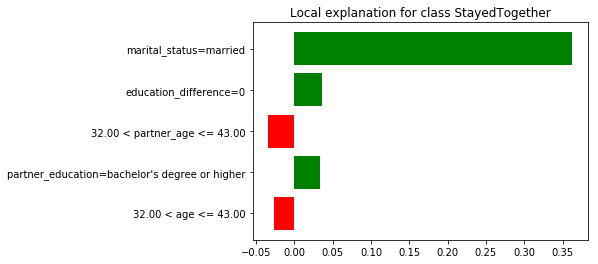

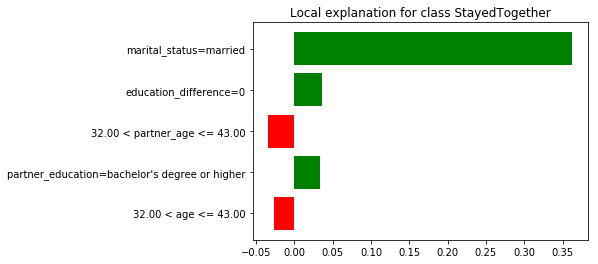

In [23]:
# Really, it's best to get married.
get_married = [34, 36, 2, 0, 1, 0, 2, 0, 0, 0, 6, 0, 1, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(get_married), pipeline.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [160]:
exp = explainer.explain_instance(np.array(get_married), pipeline.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

# Keras NN

In [24]:
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV

from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.utils import np_utils

Using TensorFlow backend.


In [48]:
lr = LogisticRegressionCV()
lr.fit(train, labels_train)

d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\sklearn\model_selection\_split.py:1943: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\sklearn\linear_model\logistic.py:757: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\sklearn\linear_model\logistic.py:757: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\sklearn\linear_model\logistic.py:757: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
d:\Users\oldyu\Anaconda3\envs\fastai\lib\site-packages\sklearn\linear

LogisticRegressionCV(Cs=10, class_weight=None, cv='warn', dual=False,
           fit_intercept=True, intercept_scaling=1.0, max_iter=100,
           multi_class='warn', n_jobs=None, penalty='l2',
           random_state=None, refit=True, scoring=None, solver='lbfgs',
           tol=0.0001, verbose=0)

In [50]:

print("Accuracy = {:.2f}".format(lr.score(test, labels_test)))

Accuracy = 0.77


In [52]:
def one_hot_encode_object_array(arr):
    '''One hot encode a numpy array of objects (e.g. strings)'''
    uniques, ids = np.unique(arr, return_inverse=True)
    return np_utils.to_categorical(ids, len(uniques))

train_y_ohe = one_hot_encode_object_array(labels_train)
test_y_ohe = one_hot_encode_object_array(labels_test)

In [121]:
train.shape

(1030, 18)

In [141]:
import keras
from keras.layers import Dense,Dropout
from keras.models import Sequential
from keras import optimizers
from keras.callbacks import EarlyStopping
from sklearn.utils import class_weight

adam = optimizers.Adam(lr = 0.0001)

###
Classifier = Sequential()
Classifier.add(Dense(units = 1024,activation = 'relu'
                     ,kernel_initializer="uniform", input_shape=(18,)))
Classifier.add(Dropout(0.6))
Classifier.add(Dense(units = 1024, activation = 'relu'
                     ,kernel_initializer="uniform"))
Classifier.add(Dropout(0.6))
Classifier.add(Dense(units = 512, activation = 'relu'
                     ,kernel_initializer="uniform"))
Classifier.add(Dropout(0.6))
Classifier.add(Dense(units = 512, activation = 'relu'
                     ,kernel_initializer="uniform"))
Classifier.add(Dropout(0.6))
Classifier.add(Dense(units = 256, activation = 'relu'
                     ,kernel_initializer="uniform"))
Classifier.add(Dropout(0.4))
Classifier.add(Dense(units = 128,activation = 'relu'
                     ,kernel_initializer = 'uniform'))
Classifier.add(Dropout(0.4))
Classifier.add(Dense(units = 64,activation = 'relu'
                     ,kernel_initializer = 'uniform'))
Classifier.add(Dense(units = 1,activation = 'sigmoid'
                     ,kernel_initializer="uniform"))

###
Classifier.compile(optimizer = 'adam',loss = 'binary_crossentropy'
                   ,metrics = ['accuracy'])

## 
ES = EarlyStopping(monitor='val_loss', patience=10
                           , verbose=0, mode='auto')

weight = class_weight.compute_class_weight('balanced'
                                           ,np.unique(labels_train),labels_train)


In [142]:
Classifier.fit(train, labels_train,batch_size = 42, epochs = 100,callbacks = [ES]
,validation_data= (test,labels_test),class_weight = weight
,shuffle=True)

Train on 1030 samples, validate on 442 samples
Epoch 1/100
1030/1030 [==============================] - 2s 2ms/step - loss: 0.5773 - acc: 0.7437 - val_loss: 0.5361 - val_acc: 0.7602
Epoch 2/100
1030/1030 [==============================] - 1s 824us/step - loss: 0.5278 - acc: 0.7718 - val_loss: 0.5506 - val_acc: 0.7602
Epoch 3/100
1030/1030 [==============================] - 1s 807us/step - loss: 0.5454 - acc: 0.7718 - val_loss: 0.5288 - val_acc: 0.7602
Epoch 4/100
1030/1030 [==============================] - 1s 811us/step - loss: 0.5407 - acc: 0.7718 - val_loss: 0.5246 - val_acc: 0.7602
Epoch 5/100
1030/1030 [==============================] - 1s 801us/step - loss: 0.5152 - acc: 0.7718 - val_loss: 0.5306 - val_acc: 0.7602
Epoch 6/100
1030/1030 [==============================] - 1s 814us/step - loss: 0.5586 - acc: 0.7718 - val_loss: 0.5220 - val_acc: 0.7602
Epoch 7/100
1030/1030 [==============================] - 1s 808us/step - loss: 0.5276 - acc: 0.7718 - val_loss: 0.5185 - val_acc: 0.7

In [148]:
# Evalute nn classifier on training data (it overfits, small sample size)
y_predict = Classifier.predict_classes(train)
f1 = f1_score(labels_train, y_predict)
print('F1 on train:', f1)

# Evalute nn classifier on test data
y_predict = Classifier.predict_classes(test)
f1 = f1_score(labels_test, y_predict)
print('F1 on test:', f1)

F1 on train: 0.8712328767123289
F1 on test: 0.8637532133676092


In [171]:
test[example].reshape((1, 18))

array([[29., 29.,  0.,  0.,  4.,  0.,  2.,  3.,  0.,  3.,  1.,  0.,  1.,
         0.,  2.,  6.,  0.,  1.]])

In [169]:
test.shape

(442, 18)

In [172]:
Classifier.predict(test[example].reshape((1, 18)))

array([[0.74434924]], dtype=float32)

In [145]:
test[example].shape

(18,)

In [175]:
test[example].reshape((1, 18))[0]

array([29., 29.,  0.,  0.,  4.,  0.,  2.,  3.,  0.,  3.,  1.,  0.,  1.,
        0.,  2.,  6.,  0.,  1.])

In [105]:

model = Sequential()

In [106]:
model.add(Dense(16, input_shape=(18,)))
model.add(Activation('sigmoid'))

In [107]:
model.add(Dense(16))
model.add(Activation('relu'))

In [108]:
model.add(Dense(2))
model.add(Activation('softmax'))

In [109]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=["accuracy"])

In [110]:
model.fit(train, train_y_ohe, epochs=100, batch_size=1, verbose=0);

In [128]:
loss, accuracy = model.evaluate(test, test_y_ohe, verbose=0)
print("Accuracy = {:.2f}".format(accuracy))

Accuracy = 0.76


In [156]:
train.shape

(1030, 18)

In [126]:
# Evalute nn classifier on training data (it overfits, small sample size)
y_predict = model.predict_classes(train)
f1 = f1_score(labels_train, y_predict)
print('F1 on train:', f1)

# Evalute nn classifier on test data
y_predict = model.predict_classes(test)
f1 = f1_score(labels_test, y_predict)
print('F1 on test:', f1)

F1 on train: 0.928659286592866
F1 on test: 0.8514285714285713


Couples probability of staying together: 0.07102653


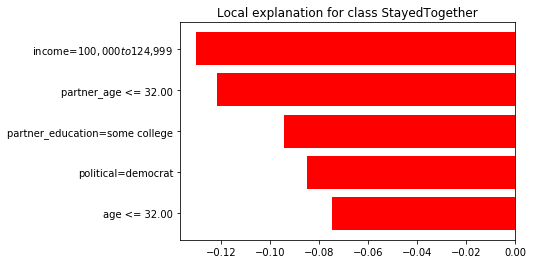

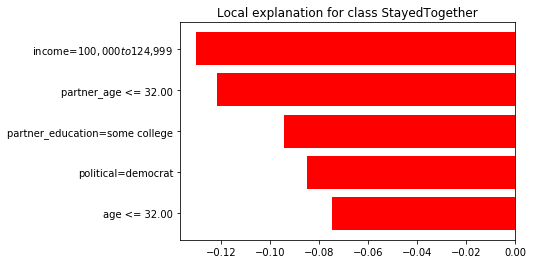

In [114]:
# Explain a prediction ("local interpretability"): 
# Now we see that the pipeline that takes raw data and returns the prediction 
# of the trained model now comes in conveniently.
example = 3
exp = explainer.explain_instance(test[example], model.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [166]:
exp = explainer.explain_instance(np.array(current), model.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

Couples probability of staying together: 0.8110811


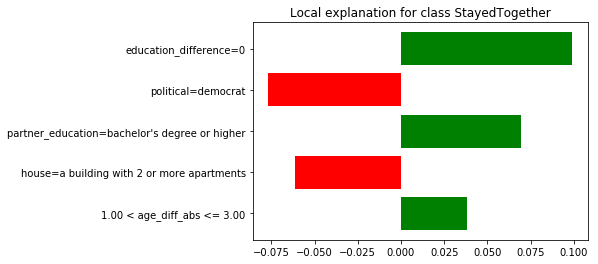

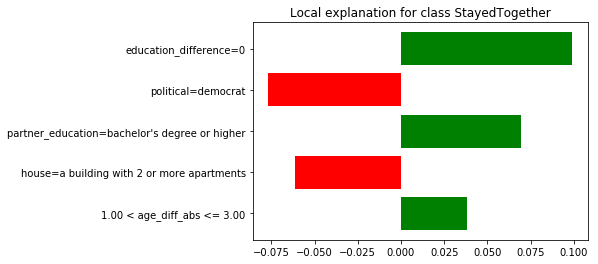

In [115]:
# Using LIME for for relationship management (not advised): Current chance of relationship success.
current = [34, 36, 2, 0, 1, 0, 1, 0, 0, 0, 18, 0, 2, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(current), model.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [164]:
exp = explainer.explain_instance(np.array(increase_income), model.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

Couples probability of staying together: 0.77586156


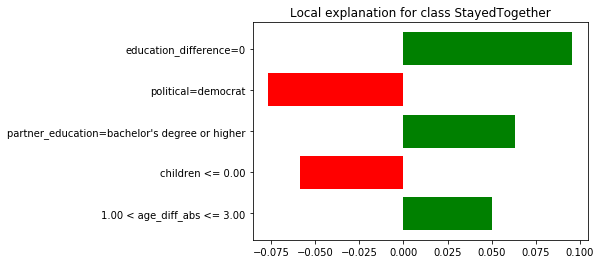

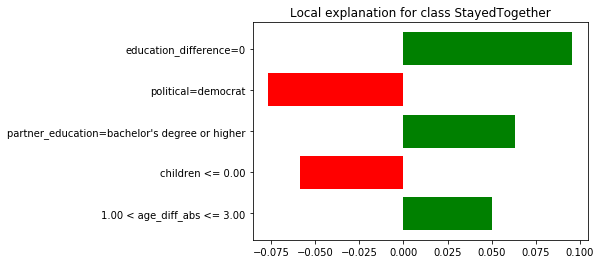

In [165]:
# Should I ask for a pay increase? It doesn't matter much.
increase_income = [34, 36, 2, 0, 1, 0, 1, 0, 0, 0, 6, 0, 2, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(increase_income), model.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [162]:
exp = explainer.explain_instance(np.array(buy_house), model.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

Couples probability of staying together: 0.825494


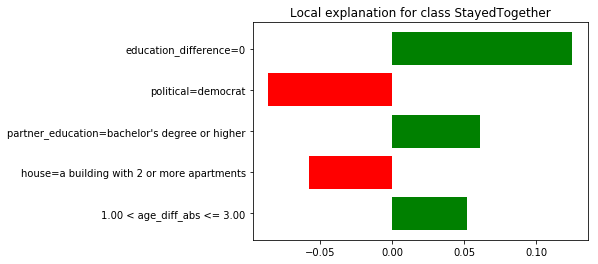

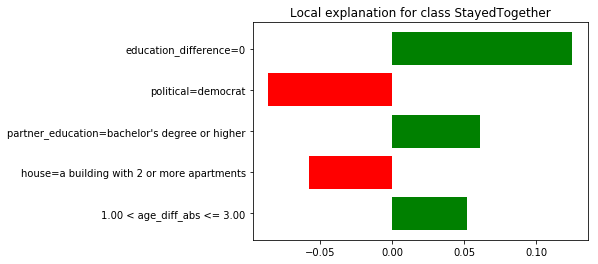

In [118]:
# Should I buy a house? Maybe?
buy_house = [34, 36, 2, 0, 1, 0, 1, 0, 0, 0, 6, 0, 1, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(buy_house), model.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()

In [161]:
exp = explainer.explain_instance(np.array(get_married), model.predict_proba, num_features=5)
exp.show_in_notebook(show_all=False)

Couples probability of staying together: 0.87283593


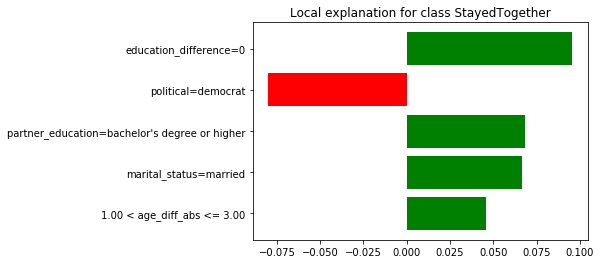

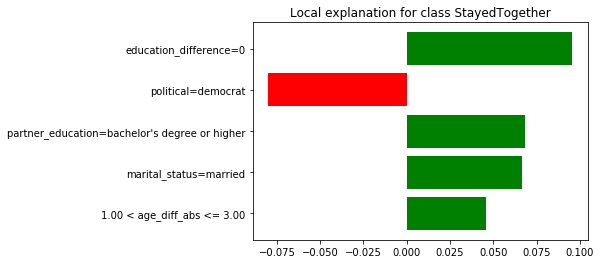

In [119]:

# Really, it's best to get married.
get_married = [34, 36, 2, 0, 1, 0, 2, 0, 0, 0, 6, 0, 1, 0, 8, 4, 0, 0]
exp = explainer.explain_instance(np.array(get_married), model.predict_proba, num_features=5)
print('Couples probability of staying together:', exp.predict_proba[1])
exp.as_pyplot_figure()